In [1]:
# Import relevant modules

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import string
import regex as re
import spacy

from nltk.corpus import stopwords
# nltk.download('stopwords')
# nltk.download('punkt')
from nltk import word_tokenize
from nltk import FreqDist

import warnings
warnings.filterwarnings('ignore')

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import recall_score, accuracy_score, f1_score, confusion_matrix, classification_report
from sklearn.utils import class_weight
from sklearn.pipeline import Pipeline
from sklearn.base import TransformerMixin
from sklearn import set_config

from PIL import Image
from wordcloud import WordCloud
from textwrap import wrap

import joblib

## Importing the dataframe

Here we import the data scraped for use this notebook:

In [5]:
# Reading the DataFrame created in the Data scraping notebook 
df = pd.read_csv('..\Data\cities_df', index_col=0)
df.head(10)

,Attraction,City
0,SEA LIFE London Aquarium Admission Ticket,"London, United Kingdom"
1,The Jack The Ripper Walking Tour in London,"London, United Kingdom"
2,Ghost Bus Tour of London,"London, United Kingdom"
3,Big Bus London Hop-On Hop-Off Tour and River C...,"London, United Kingdom"
4,The Blood and Tears Walk: Serial Killers and L...,"London, United Kingdom"
5,London Ghost and Infamous Murders Walking Tour,"London, United Kingdom"
6,"Stonehenge, Windsor Castle, and Bath from London","London, United Kingdom"
7,Warner Bros. Studio: The Making of Harry Potte...,"London, United Kingdom"
8,"Ghosts, Ghouls & Gallows: London Virtual Tour","London, United Kingdom"
9,High-Speed Thames River RIB Cruise in London,"London, United Kingdom"


## Data Exploration

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28379 entries, 0 to 3693
Data columns (total 2 columns):
Attraction    28379 non-null object
City          28379 non-null object
dtypes: object(2)
memory usage: 665.1+ KB


We have 2 columns; `Attraction` and `City` <br>
Our dataset has 28379 rows , compromised of text that bear names of attraction sites.

In [11]:
## Null values
df.isnull().sum()

Attraction    0
City          0
dtype: int64

Our dataset bears no null values, this is because we scraped data individually.

In [7]:
df.describe()

,Attraction,City
count,28379,28379
unique,27466,12
top,Desert Safari Dubai,"Rome, Italy"
freq,15,5000


There are 27466 unique attractions listed across the 12 cities.<br>
The most frequent attraction listed is 'Desert Safari Dubai', which appears 15 times. The city that appears most often is 'Rome, Italy', occurring 5,000 times. 

Given the difference in count and unique values, we check for duplicates:

### Duplicates

In [12]:
df.duplicated().sum()

846

Check duplicates in London :

In [13]:
# Look at duplicates in London
df[(df.duplicated()==True) & (df['City']=='London, United Kingdom')]

,Attraction,City
185,"Windsor Castle, Stonehenge, and Oxford Day Tri...","London, United Kingdom"
241,Jack the Ripper Walking Tour in London,"London, United Kingdom"
259,British Museum Guided Tour,"London, United Kingdom"
618,Private Transfer from Heathrow Airport to London,"London, United Kingdom"
704,Oxford City Full-Day Private Tour from London,"London, United Kingdom"
705,Bath and Stonehenge Full-Day Private Tour from...,"London, United Kingdom"
706,Full-Day Private Guided Tour of Cambridge,"London, United Kingdom"
716,Full-Day Private Tour of Brighton,"London, United Kingdom"
900,PRIVATE Jack the Ripper Ghost Walking Tour in ...,"London, United Kingdom"
990,London to Southampton Cruise Terminals Private...,"London, United Kingdom"


Look at duplicates in Dubai:

In [14]:
df[(df.duplicated()==True) & (df['City']=='Dubai, United Arab Emirates')]

,Attraction,City
223,Morning Desert Safari With Quad Bike,"Dubai, United Arab Emirates"
235,Abu Dhabi City Tour From Dubai,"Dubai, United Arab Emirates"
478,Desert Safari Dubai,"Dubai, United Arab Emirates"
556,Abu Dhabi City Tour From Dubai,"Dubai, United Arab Emirates"
583,Dubai City Tour,"Dubai, United Arab Emirates"
...,...,...
3623,Private Modern Dubai Tour with Monorail Ride,"Dubai, United Arab Emirates"
3630,Al Ain City Tour,"Dubai, United Arab Emirates"
3672,"Hummer Desert Safari with BBQ Dinner, Belly Da...","Dubai, United Arab Emirates"
3689,Abu Dhabi City Tour from Dubai,"Dubai, United Arab Emirates"


In [15]:
# What about the top attraction?
df[df['Attraction']=='Desert Safari Dubai']

,Attraction,City
414,Desert Safari Dubai,"Dubai, United Arab Emirates"
478,Desert Safari Dubai,"Dubai, United Arab Emirates"
811,Desert Safari Dubai,"Dubai, United Arab Emirates"
974,Desert Safari Dubai,"Dubai, United Arab Emirates"
998,Desert Safari Dubai,"Dubai, United Arab Emirates"
1001,Desert Safari Dubai,"Dubai, United Arab Emirates"
1689,Desert Safari Dubai,"Dubai, United Arab Emirates"
1718,Desert Safari Dubai,"Dubai, United Arab Emirates"
1722,Desert Safari Dubai,"Dubai, United Arab Emirates"
1944,Desert Safari Dubai,"Dubai, United Arab Emirates"


This calls for removals of duplicates; there are exact duplicates for some cities

In [16]:
df = df.drop_duplicates()

In [17]:
df.duplicated().sum()

0

### Class Imbalance

In [18]:
display(df.City.unique())
print('Total Unique Cities:', len(df.City.unique()))

array(['London, United Kingdom', 'Paris, France', 'Crete, Greece',
       'Bali, Indonesia', 'Rome, Italy', 'Phuket, Thailand',
       'Sicily, Italy', 'Majorca, Balearic Islands', 'Barcelona, Spain',
       'Istanbul, Turkey', 'Goa, India', 'Dubai, United Arab Emirates'],
      dtype=object)

Total Unique Cities: 12


In [19]:
df.City.value_counts(normalize=True)

Bali, Indonesia                0.177823
Rome, Italy                    0.174990
Dubai, United Arab Emirates    0.123597
London, United Kingdom         0.099626
Paris, France                  0.096938
Istanbul, Turkey               0.081248
Sicily, Italy                  0.071986
Barcelona, Spain               0.066502
Phuket, Thailand               0.041260
Crete, Greece                  0.037010
Majorca, Balearic Islands      0.016489
Goa, India                     0.012530
Name: City, dtype: float64

**Summary:** <br>
- Bali, Indonesia is the most common city, making up approximately 17.7823% of the entries followed by Rome,the second most common, comprising roughly 17.4%
- This output is useful for understanding the distribution of the dataset across different cities and can highlight any imbalances or biases toward certain locations. For example, we can see that a few cities like Bali, Rome, and Dubai make up a large portion of the data, which can have implications for any analysis performed on this dataset.

In [20]:
#Rank the cities by number of attractions  
cities = df.groupby('City').count()

In [21]:
#Sort the cities by number of attractions
cities.reset_index(inplace=True)

In [23]:

sorted_cities = cities.sort_values(by='Attraction', ascending=False)
sorted_cities

,City,Attraction
0,"Bali, Indonesia",4896
10,"Rome, Italy",4818
3,"Dubai, United Arab Emirates",3403
6,"London, United Kingdom",2743
8,"Paris, France",2669
5,"Istanbul, Turkey",2237
11,"Sicily, Italy",1982
1,"Barcelona, Spain",1831
9,"Phuket, Thailand",1136
2,"Crete, Greece",1019


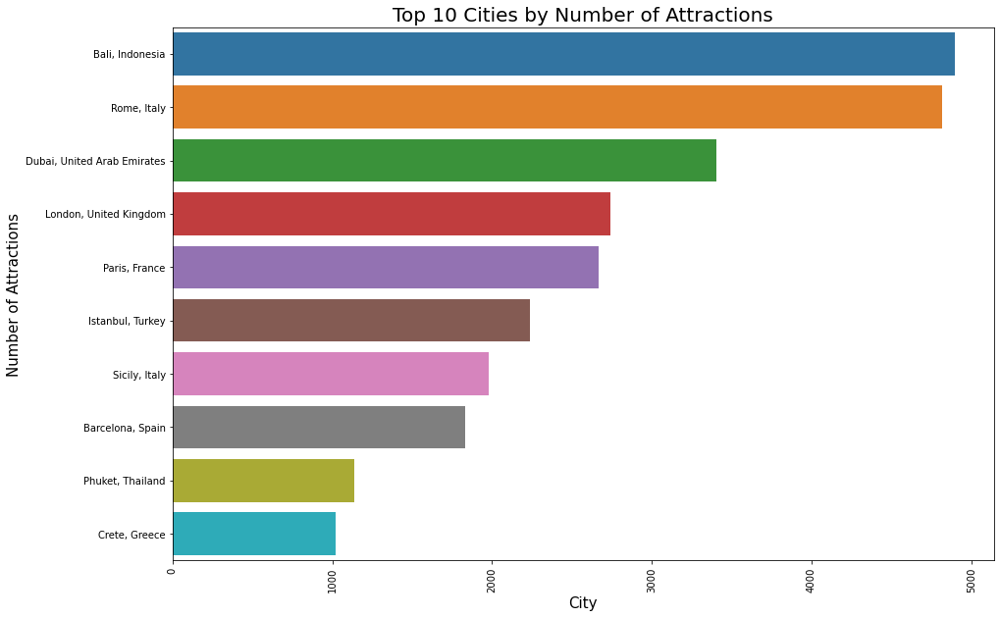

In [27]:
#Plot the top 10 cities by number of attractions
plt.figure(figsize=(15,10))
sns.barplot(x='Attraction', y='City', data=sorted_cities.head(10))
plt.xticks(rotation=90)
plt.xlabel('City', fontsize=15)
plt.ylabel('Number of Attractions', fontsize=15)
plt.title('Top 10 Cities by Number of Attractions', fontsize=20)
plt.show()


**This will likely be an issue when modeling, so I will try to use class weights to fix this problem.**
<br>
When the data has an uneven distribution of classes, as it seems to be in this dataset where some cities have many more attractions listed than others, it can bias a predictive model towards the more common classes. This is because the model may minimize its loss (error) by focusing on the more frequent classes at the expense of the less frequent ones.

By assigning a higher weight to the underrepresented classes and a lower weight to the overrepresented ones, the model can be encouraged to pay more attention to the underrepresented classes. This helps in making the model more general and less biased towards the majority class, which can improve its performance on unseen data, particularly for those underrepresented classes.

In practical terms, many machine learning algorithms have parameters that allow for the setting of class weights. By setting these appropriately, you can mitigate the effects of imbalanced datasets and achieve a more equitable performance across all classes.

## Text Cleaning & Preprocessing & Further Analysis


Here, we'll delve further into detiled cleaning of the scraped data(text). This includes removing punctuation, lowercasing evrything, dealing with stopwords.


Stopwords are words that are filtered out before or after processing text, like 'is', 'the', 'a', 'an', 'in', etc. 

The reason for filtering out stopwords is that they occur so frequently in any text that they don't have much substantive information about the actual contents of the document. They can add noise to the analysis, so they are often removed.


In [31]:
#Stopwords
stopwords_list = stopwords.words('english')
stopwords_list += list(string.punctuation)
# Preview the list
stopwords_list[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [32]:
# Save stopwords list for app
joblib.dump(stopwords_list, '..\Data\stopwords_list')

['..\\Data\\stopwords_list']

In [34]:
# Lowercase all words in each corpus
df['cleaned'] = df['Attraction'].apply(lambda x: x.lower())
df.head(10)

,Attraction,City,cleaned
0,SEA LIFE London Aquarium Admission Ticket,"London, United Kingdom",sea life london aquarium admission ticket
1,The Jack The Ripper Walking Tour in London,"London, United Kingdom",the jack the ripper walking tour in london
2,Ghost Bus Tour of London,"London, United Kingdom",ghost bus tour of london
3,Big Bus London Hop-On Hop-Off Tour and River C...,"London, United Kingdom",big bus london hop-on hop-off tour and river c...
4,The Blood and Tears Walk: Serial Killers and L...,"London, United Kingdom",the blood and tears walk: serial killers and l...
5,London Ghost and Infamous Murders Walking Tour,"London, United Kingdom",london ghost and infamous murders walking tour
6,"Stonehenge, Windsor Castle, and Bath from London","London, United Kingdom","stonehenge, windsor castle, and bath from london"
7,Warner Bros. Studio: The Making of Harry Potte...,"London, United Kingdom",warner bros. studio: the making of harry potte...
8,"Ghosts, Ghouls & Gallows: London Virtual Tour","London, United Kingdom","ghosts, ghouls & gallows: london virtual tour"
9,High-Speed Thames River RIB Cruise in London,"London, United Kingdom",high-speed thames river rib cruise in london


In [36]:
# Remove commas, hyphens, colons, and other punctuation
df['cleaned'] = df['cleaned'].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x))
df.head(10)

,Attraction,City,cleaned
0,SEA LIFE London Aquarium Admission Ticket,"London, United Kingdom",sea life london aquarium admission ticket
1,The Jack The Ripper Walking Tour in London,"London, United Kingdom",the jack the ripper walking tour in london
2,Ghost Bus Tour of London,"London, United Kingdom",ghost bus tour of london
3,Big Bus London Hop-On Hop-Off Tour and River C...,"London, United Kingdom",big bus london hopon hopoff tour and river cru...
4,The Blood and Tears Walk: Serial Killers and L...,"London, United Kingdom",the blood and tears walk serial killers and lo...
5,London Ghost and Infamous Murders Walking Tour,"London, United Kingdom",london ghost and infamous murders walking tour
6,"Stonehenge, Windsor Castle, and Bath from London","London, United Kingdom",stonehenge windsor castle and bath from london
7,Warner Bros. Studio: The Making of Harry Potte...,"London, United Kingdom",warner bros studio the making of harry potter ...
8,"Ghosts, Ghouls & Gallows: London Virtual Tour","London, United Kingdom",ghosts ghouls gallows london virtual tour
9,High-Speed Thames River RIB Cruise in London,"London, United Kingdom",highspeed thames river rib cruise in london


In [37]:
# Use regex to get rid of numbers 
df['cleaned'] = df['cleaned'].apply(lambda x: re.sub('\w*\d\w*','', x))
df.head(10)

,Attraction,City,cleaned
0,SEA LIFE London Aquarium Admission Ticket,"London, United Kingdom",sea life london aquarium admission ticket
1,The Jack The Ripper Walking Tour in London,"London, United Kingdom",the jack the ripper walking tour in london
2,Ghost Bus Tour of London,"London, United Kingdom",ghost bus tour of london
3,Big Bus London Hop-On Hop-Off Tour and River C...,"London, United Kingdom",big bus london hopon hopoff tour and river cru...
4,The Blood and Tears Walk: Serial Killers and L...,"London, United Kingdom",the blood and tears walk serial killers and lo...
5,London Ghost and Infamous Murders Walking Tour,"London, United Kingdom",london ghost and infamous murders walking tour
6,"Stonehenge, Windsor Castle, and Bath from London","London, United Kingdom",stonehenge windsor castle and bath from london
7,Warner Bros. Studio: The Making of Harry Potte...,"London, United Kingdom",warner bros studio the making of harry potter ...
8,"Ghosts, Ghouls & Gallows: London Virtual Tour","London, United Kingdom",ghosts ghouls gallows london virtual tour
9,High-Speed Thames River RIB Cruise in London,"London, United Kingdom",highspeed thames river rib cruise in london


We'll use `Spacy` for tokenization(breaking down text into words,phrases,symbols or other meaningful elements) and stop word removal.

In [38]:
nlp = spacy.load('en_core_web_sm')
df['lemmatized'] = df['cleaned'].apply(lambda x: ' '.join(
                                    [token.lemma_ for token in list(nlp(x)) if (token.is_stop==False)]))
df.head(10)

,Attraction,City,cleaned,lemmatized
0,SEA LIFE London Aquarium Admission Ticket,"London, United Kingdom",sea life london aquarium admission ticket,sea life london aquarium admission ticket
1,The Jack The Ripper Walking Tour in London,"London, United Kingdom",the jack the ripper walking tour in london,jack ripper walking tour london
2,Ghost Bus Tour of London,"London, United Kingdom",ghost bus tour of london,ghost bus tour london
3,Big Bus London Hop-On Hop-Off Tour and River C...,"London, United Kingdom",big bus london hopon hopoff tour and river cru...,big bus london hopon hopoff tour river cruise ...
4,The Blood and Tears Walk: Serial Killers and L...,"London, United Kingdom",the blood and tears walk serial killers and lo...,blood tear walk serial killer london horror
5,London Ghost and Infamous Murders Walking Tour,"London, United Kingdom",london ghost and infamous murders walking tour,london ghost infamous murder walk tour
6,"Stonehenge, Windsor Castle, and Bath from London","London, United Kingdom",stonehenge windsor castle and bath from london,stonehenge windsor castle bath london
7,Warner Bros. Studio: The Making of Harry Potte...,"London, United Kingdom",warner bros studio the making of harry potter ...,warner bros studio making harry potter luxury ...
8,"Ghosts, Ghouls & Gallows: London Virtual Tour","London, United Kingdom",ghosts ghouls gallows london virtual tour,ghosts ghoul gallow london virtual tour
9,High-Speed Thames River RIB Cruise in London,"London, United Kingdom",highspeed thames river rib cruise in london,highspeed thames river rib cruise london


In [39]:
# Group the corpora by city and join them
df_to_group = df[['City', 'lemmatized']]
df_grouped = df_to_group.groupby(by='City').agg(lambda x:' '.join(x))
df_grouped

,lemmatized
City,
"Bali, Indonesia",hotel hotelbali private transfer daytime bali ...
"Barcelona, Spain",interactive spanish cooking experience barcelo...
"Crete, Greece",minoans world museum cinema crete wine ol...
"Dubai, United Arab Emirates",premium red dune camel safari bbq al khayma ...
"Goa, India",fontainhas heritage walk sunset cruise paradis...
"Istanbul, Turkey",bosphorus sunset cruise luxury yacht istanbu...
"London, United Kingdom",sea life london aquarium admission ticket jack...
"Majorca, Balearic Islands",cave genova admission palma de mallorca shore ...
"Paris, France",bateaux parisien seine river gourmet dinner ...


In [40]:
# Save the grouped dataframe for the app
df_grouped.to_csv('../Data/df_grouped')

### Look at different vectorization strategies
Try different vectorization strategies then visualize each with word clouds:
- Count vectorization
- tf-idf vectorization
- bi-grams

### Create a document term matrix using count vectorization

In [41]:
# Using count vectorization (most simple way to vectorize)
cv = CountVectorizer(analyzer='word', stop_words=stopwords_list)
data = cv.fit_transform(df_grouped['lemmatized'])
df_dtm = pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm.index = df_grouped.index
df_dtm

,aal,abandon,abant,abba,abbate,abbey,abbeyprivate,abbeyst,aberfan,abian,...,تشيتا,خصوصي,دي,روما,فورميا,كاستيلوا,مدينة,من,ميرتيتوا,نقل
City,,,,,,,,,,,,,,,,,,,,,
"Bali, Indonesia",0,2,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
"Barcelona, Spain",1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Crete, Greece",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Dubai, United Arab Emirates",0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Goa, India",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Istanbul, Turkey",0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"London, United Kingdom",0,0,0,1,0,61,1,2,1,0,...,0,0,0,0,0,0,0,0,0,0
"Majorca, Balearic Islands",0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Paris, France",0,0,0,0,0,5,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Create a document term matrix using TF-IDF vectorization


In [44]:
# using TF-IDF vectorization Might
tfidf = TfidfVectorizer(analyzer='word', stop_words=stopwords_list)
data2 = tfidf.fit_transform(df_grouped['lemmatized'])
df_dtm2 = pd.DataFrame(data2.toarray(), columns=tfidf.get_feature_names())
df_dtm2.index = df_grouped.index
df_dtm2

,aal,abandon,abant,abba,abbate,abbey,abbeyprivate,abbeyst,aberfan,abian,...,تشيتا,خصوصي,دي,روما,فورميا,كاستيلوا,مدينة,من,ميرتيتوا,نقل
City,,,,,,,,,,,,,,,,,,,,,
"Bali, Indonesia",0.000000,0.000699,0.000000,0.0000,0.000000,0.000000,0.0000,0.000000,0.0000,0.000407,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Barcelona, Spain",0.000737,0.000000,0.000000,0.0000,0.000000,0.000000,0.0000,0.000000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Crete, Greece",0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.0000,0.000000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Dubai, United Arab Emirates",0.000000,0.000309,0.000000,0.0000,0.000000,0.000000,0.0000,0.000000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Goa, India",0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.0000,0.000000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Istanbul, Turkey",0.000000,0.000000,0.000589,0.0000,0.000000,0.000000,0.0000,0.000000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"London, United Kingdom",0.000000,0.000000,0.000000,0.0005,0.000000,0.023151,0.0005,0.001001,0.0005,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Majorca, Balearic Islands",0.000000,0.000000,0.000000,0.0000,0.003344,0.000000,0.0000,0.000000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Paris, France",0.000000,0.000000,0.000000,0.0000,0.000000,0.002363,0.0000,0.000000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Proceed to create wordclouds:

In [47]:
def generate_wordcloud(data, title):
    """  
    this function generates a wordcloud from a dictionary of words and their frequencies
    """
    cloud = WordCloud(width=400, height=330, max_words=150, colormap='tab20c').generate_from_frequencies(data)
    plt.figure(figsize=(10,8))
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis('off')
    plt.title('\n'.join(wrap(title,60)), fontsize=13)
    plt.show()

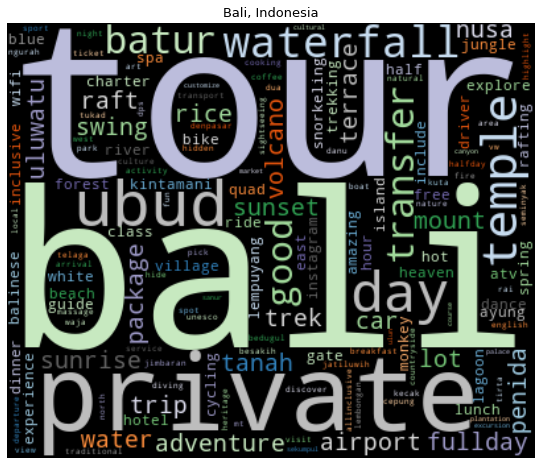

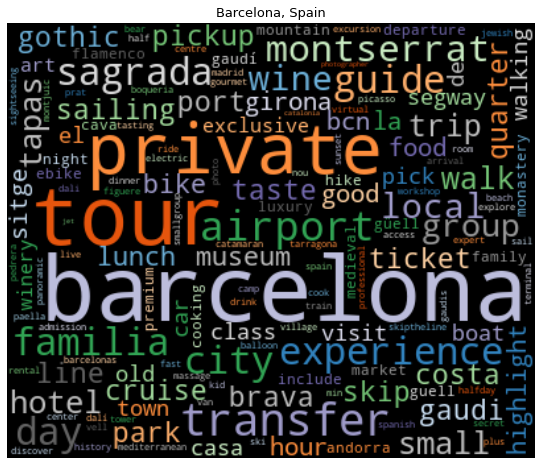

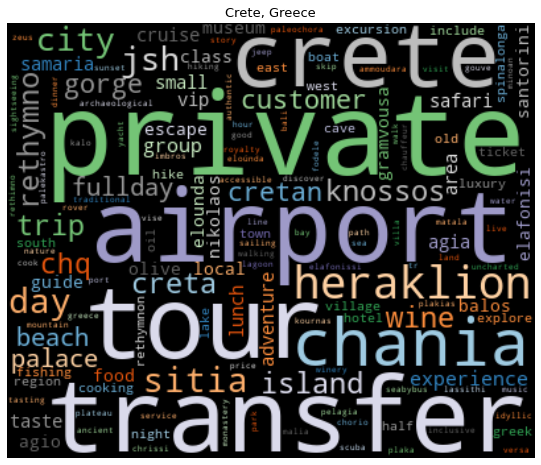

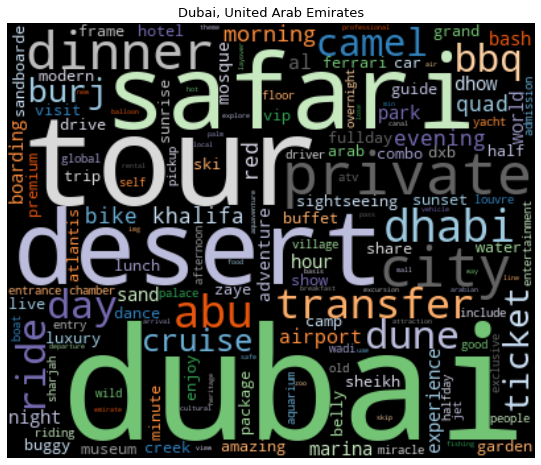

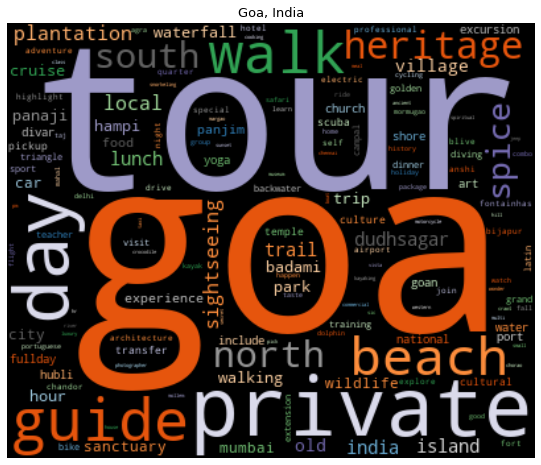

...

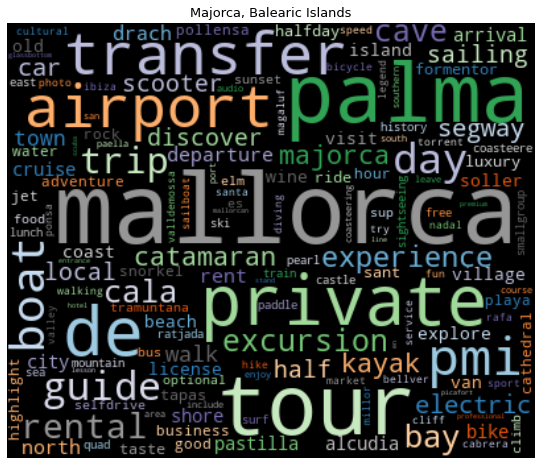

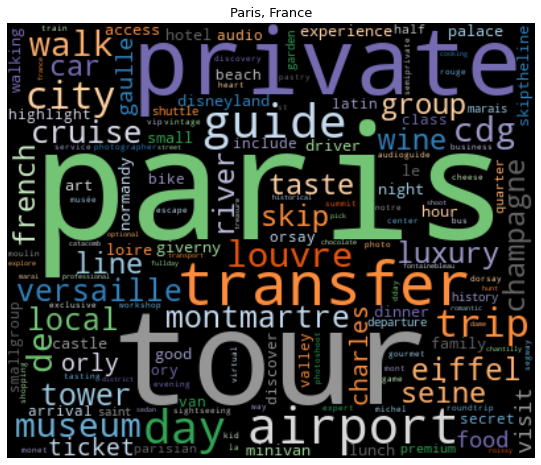

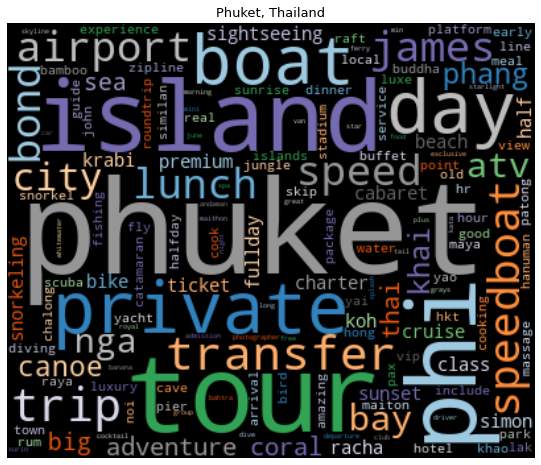

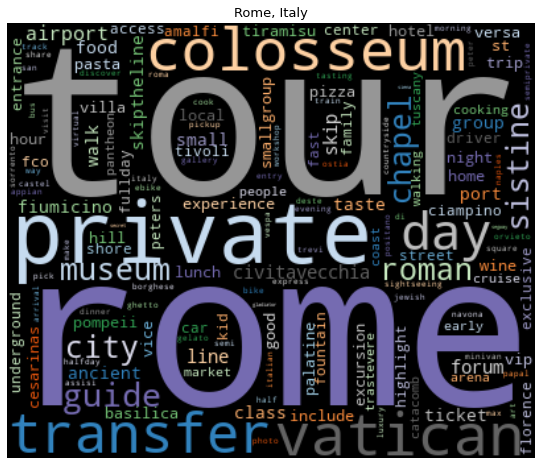

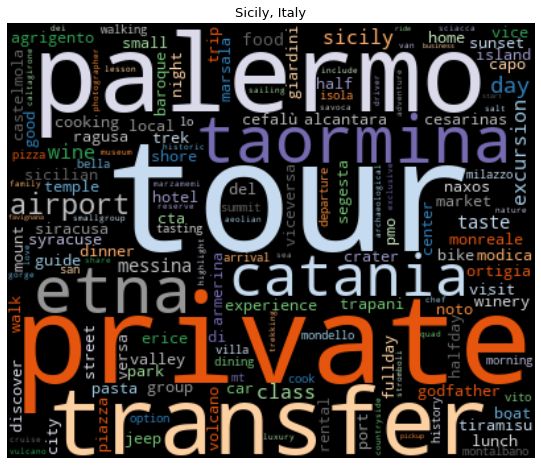

In [46]:
# Transposing document term matrix
df_dtm = df_dtm.transpose()

# Plotting word cloud for each city
for index, city in enumerate(df_dtm.columns):
    generate_wordcloud(df_dtm[city].sort_values(ascending=False), city)

In [48]:
# Look at top words with count vectorizer (in total, not per city)
sum_words = data.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
words_freq

[('tour', 13527),
 ('private', 8730),
 ('transfer', 3613),
 ('day', 3533),
 ('airport', 2945),
 ('rome', 2814),
 ('bali', 2359),
 ('dubai', 2331),
 ('city', 2130),
 ('london', 2075),
 ('paris', 1871),
 ('guide', 1602),
 ('istanbul', 1473),
 ('barcelona', 1244),
 ('trip', 1153),
 ('safari', 1056),
 ('dinner', 992),
 ('desert', 967),
 ('ubud', 926),
 ('cruise', 923),
 ('walk', 921),
 ('experience', 884),
 ('ticket', 847),
 ('museum', 817),
 ('hotel', 796),
 ('lunch', 788),
 ('group', 730),
 ('good', 715),
 ('local', 713),
 ('colosseum', 698),
 ('vatican', 696),
 ('phuket', 644),
 ('class', 642),
 ('food', 638),
 ('fullday', 635),
 ('car', 630),
 ('island', 624),
 ('ride', 624),
 ('temple', 619),
 ('bike', 589),
 ('wine', 587),
 ('small', 582),
 ('night', 582),
 ('include', 579),
 ('taste', 576),
 ('line', 554),
 ('hour', 545),
 ('luxury', 536),
 ('skip', 528),
 ('adventure', 495),
 ('half', 478),
 ('palermo', 473),
 ('waterfall', 446),
 ('abu', 434),
 ('sightseeing', 431),
 ('dhabi', 431

From the above ,there is a lot of repetition with words like 'tour', 'private', 'transfer' between cities because all of these cities will have airport transfers, and different tours. However, these words will not help in modeling since they are not unique to the cities.

## Words Cloud with TF-IDF Vectorization

Proceed to create wordclouds:

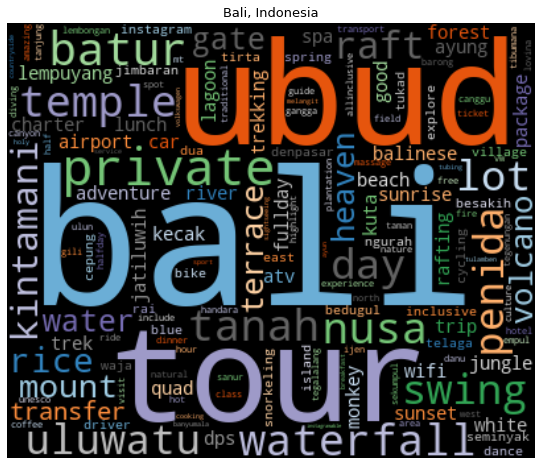

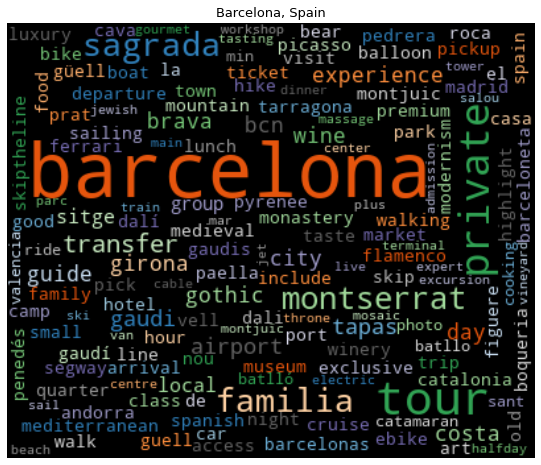

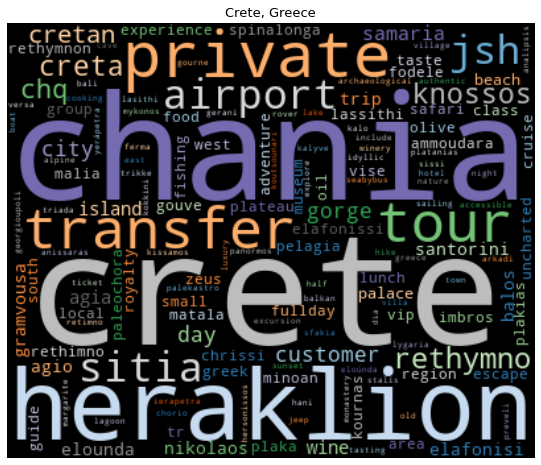

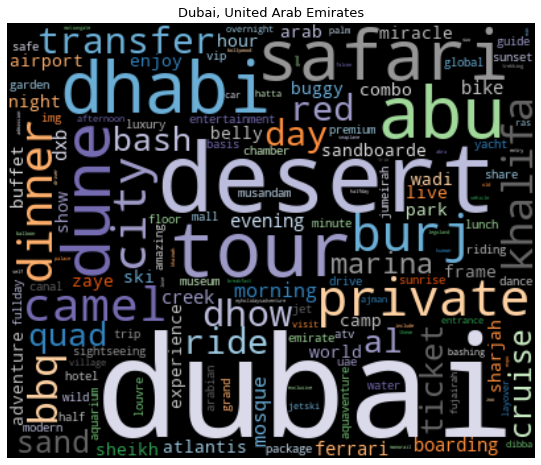

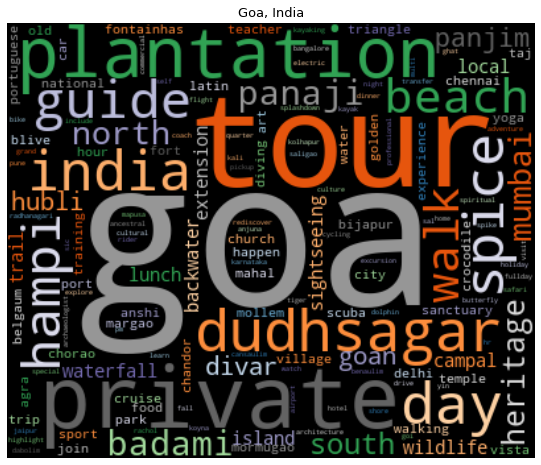

...

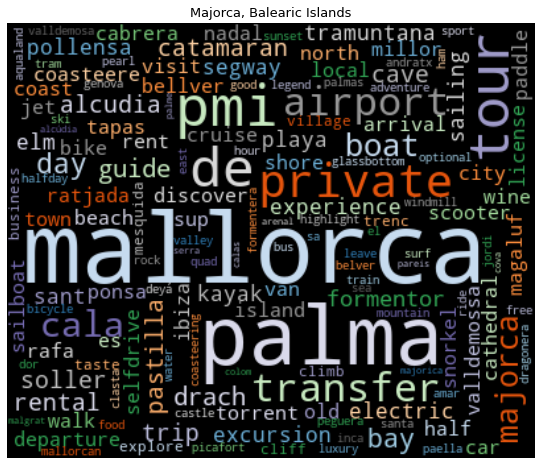

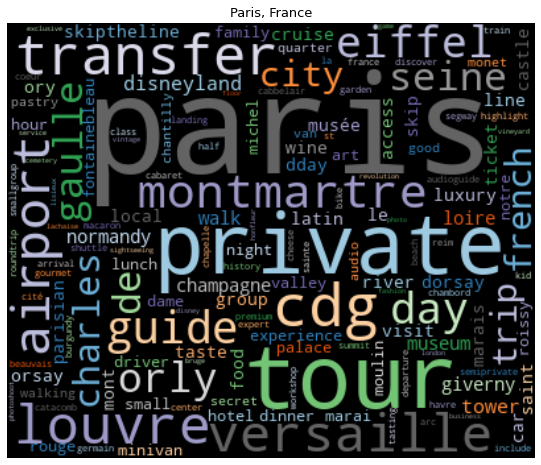

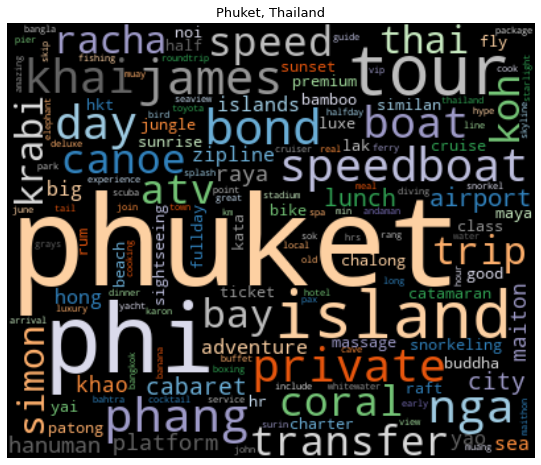

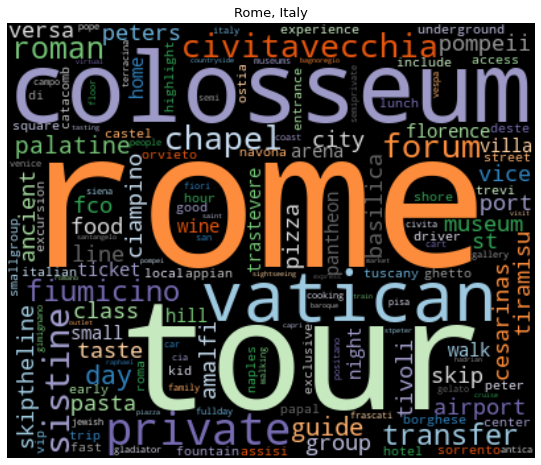

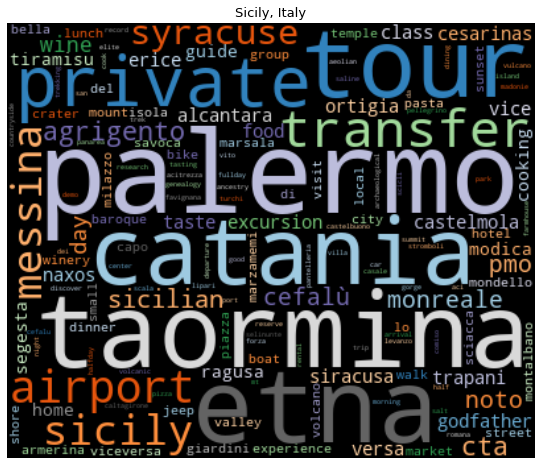

In [49]:
# Transposing document term matrix
df_dtm2 = df_dtm2.transpose()

# Plotting word cloud for each city
for index, city in enumerate(df_dtm2.columns):
    generate_wordcloud(df_dtm2[city].sort_values(ascending=False), city)

In [50]:
# Check for top words with tf-idf vectorization (for total words, not per city)
sum_words = data2.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in tfidf.vocabulary_.items()]
words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
words_freq

[('tour', 3.138098562201453),
 ('private', 2.0825423088575428),
 ('transfer', 0.9858659955017881),
 ('goa', 0.9237376001392338),
 ('barcelona', 0.916553640718507),
 ('london', 0.8927533459748753),
 ('paris', 0.8822607586615051),
 ('istanbul', 0.8681465446126231),
 ('airport', 0.8578475408738101),
 ('dubai', 0.8396210065107451),
 ('day', 0.8337294625779452),
 ('phuket', 0.8033367684025245),
 ('mallorca', 0.7490675159701988),
 ('bali', 0.7376600455046178),
 ('rome', 0.6629694357497168),
 ('palma', 0.5082958144083493),
 ('crete', 0.4738788186359383),
 ('palermo', 0.4686929630407816),
 ('city', 0.4658936476639842),
 ('chania', 0.4492617371483571),
 ('phi', 0.4166373923081416),
 ('guide', 0.40388686280511066),
 ('taormina', 0.38589119407720635),
 ('etna', 0.3824251055076506),
 ('heraklion', 0.37951333960021033),
 ('ubud', 0.37703781127932107),
 ('trip', 0.3233023886377564),
 ('catania', 0.32283382386081877),
 ('island', 0.3070577380372553),
 ('desert', 0.3020386322104823),
 ('colosseum', 0.

**In contrast, there is not as much overlap with these words as in the count vectorization because tf-idf vectorization is finding more words that are unique to the cities. This tells us that tf-idf vectorization is probably a better vectorization technique to use while modeling in order to best predict the cities.**

#### Word Clouds with Bi-Grams

In [51]:
cv2 = CountVectorizer(analyzer='word', stop_words=stopwords_list, ngram_range=(2,2))
data3 = cv2.fit_transform(df_grouped['lemmatized'])
df_dtm3 = pd.DataFrame(data3.toarray(), columns=cv2.get_feature_names())
df_dtm3.index = df_grouped.index
df_dtm3

,aal deep,abandon ghost,abandon hotel,abandon village,abant yedigoller,abba super,abbate arrival,abbey avebury,abbey banquet,abbey buckingham,...,روما إلى,فورميا العكس,كاستيلوا العكس,مدينة بوجيوا,مدينة تشيتا,مدينة روما,مدينة فورميا,من مدينة,ميرتيتوا العكس,نقل خصوصي
City,,,,,,,,,,,,,,,,,,,,,
"Bali, Indonesia",0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Barcelona, Spain",1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Crete, Greece",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Dubai, United Arab Emirates",0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Goa, India",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Istanbul, Turkey",0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"London, United Kingdom",0,0,0,0,0,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
"Majorca, Balearic Islands",0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Paris, France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


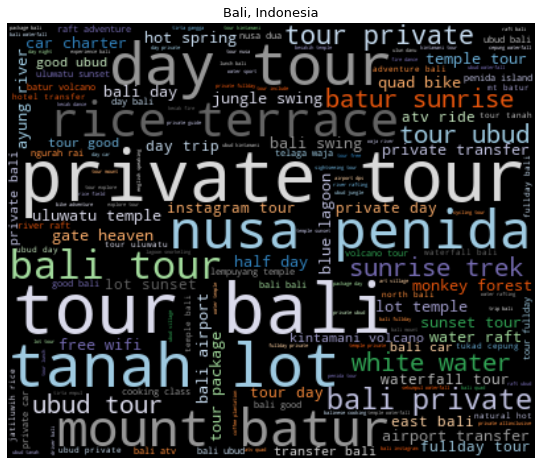

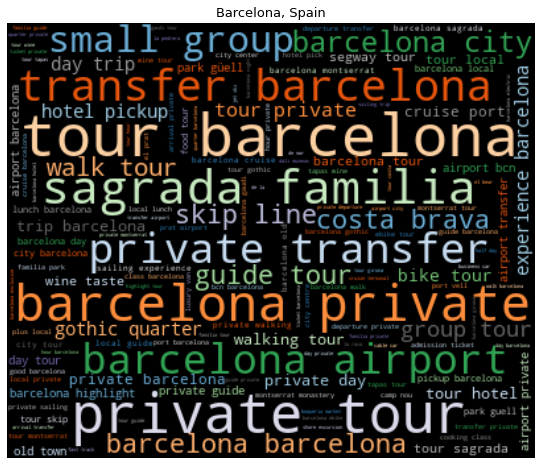

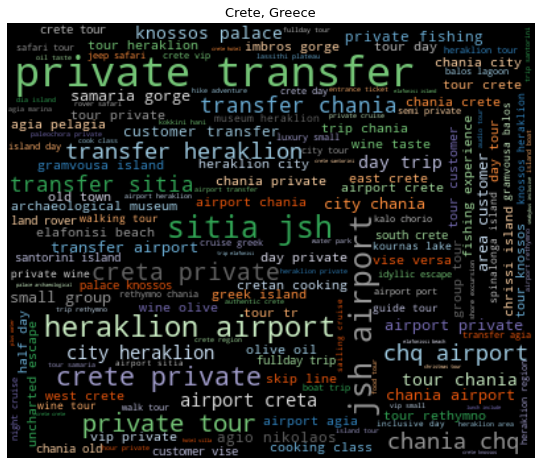

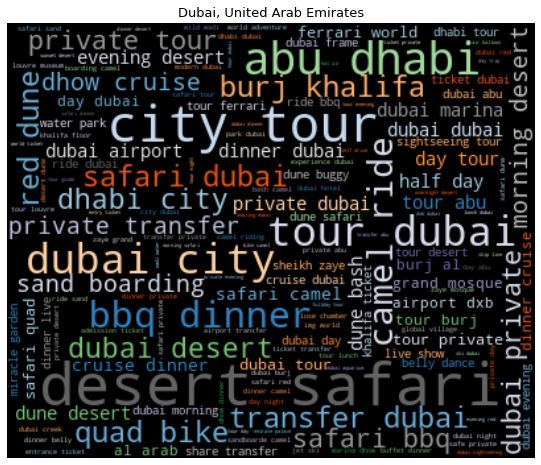

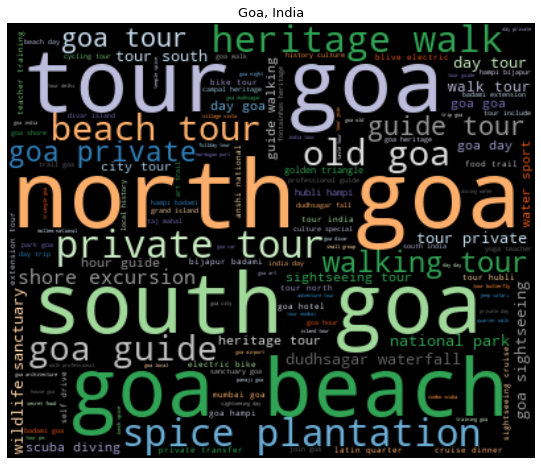

...

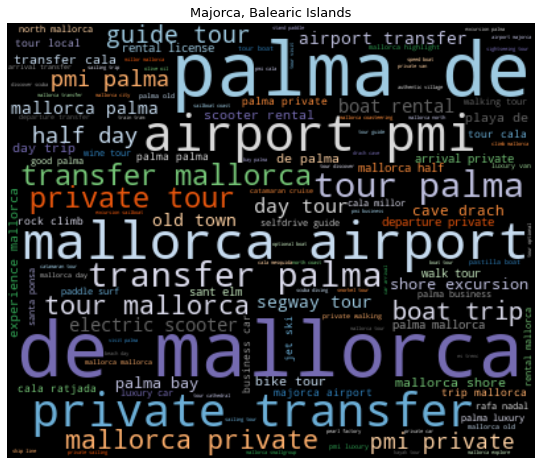

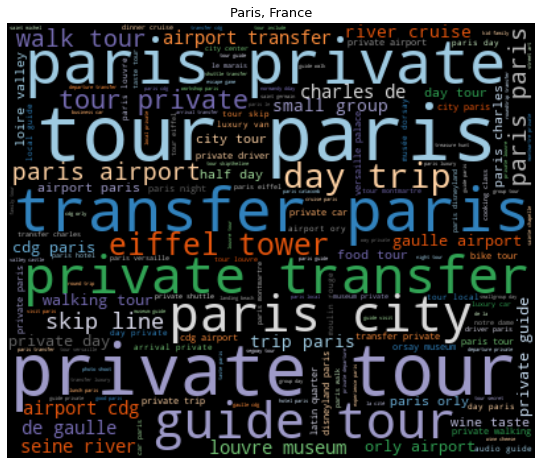

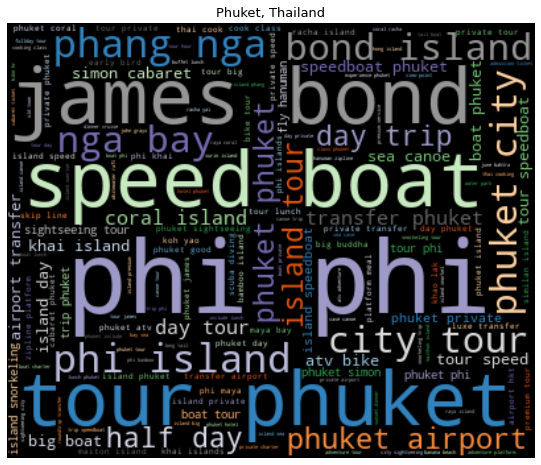

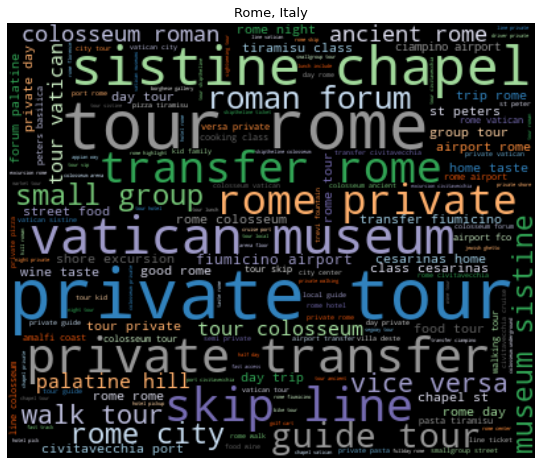

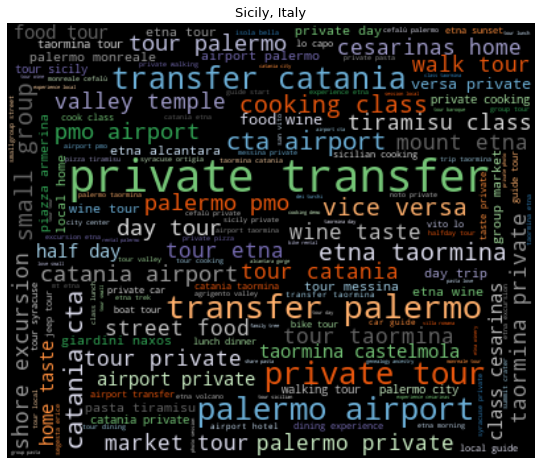

In [52]:
# Transposing document term matrix
df_dtm3 = df_dtm3.transpose()

# Plotting word cloud for each city
for index, city in enumerate(df_dtm3.columns):
    generate_wordcloud(df_dtm3[city].sort_values(ascending=False), city)

In [53]:
# Check most frequents words with bi-grams (in total, not per city)
sum_words = data3.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in cv2.vocabulary_.items()]
words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
words_freq

[('private tour', 2228),
 ('private transfer', 1569),
 ('day tour', 824),
 ('city tour', 818),
 ('tour private', 813),
 ('desert safari', 765),
 ('guide tour', 625),
 ('walk tour', 618),
 ('day trip', 589),
 ('small group', 573),
 ('tour rome', 562),
 ('airport transfer', 549),
 ('skip line', 513),
 ('half day', 465),
 ('abu dhabi', 426),
 ('tour london', 424),
 ('tour istanbul', 392),
 ('private day', 386),
 ('tour bali', 350),
 ('sistine chapel', 350),
 ('dubai city', 346),
 ('tour dubai', 344),
 ('vatican museum', 311),
 ('walking tour', 307),
 ('tour day', 304),
 ('food tour', 295),
 ('tour paris', 294),
 ('quad bike', 292),
 ('airport private', 291),
 ('day private', 290),
 ('private guide', 288),
 ('bbq dinner', 285),
 ('group tour', 268),
 ('tanah lot', 259),
 ('cooking class', 256),
 ('camel ride', 252),
 ('rome private', 250),
 ('transfer rome', 249),
 ('vice versa', 236),
 ('shore excursion', 230),
 ('roman forum', 230),
 ('london private', 223),
 ('wine taste', 207),
 ('sigh

**Observation**:

The bi-grams were able to pick out important terms, such as 'windsor castle' for London, and 'cooking class' for Sicily. However, words like 'tour' are creating some noise in most of these cities.

### Removing Noise from data

There are lots of words in the word clouds like 'private', 'airport' and 'transfer', that are causing noise to the data.<br>This may interfere with model prediction accuracy, we proceed to clean:

In [54]:
df.head()

,Attraction,City,cleaned,lemmatized
0,SEA LIFE London Aquarium Admission Ticket,"London, United Kingdom",sea life london aquarium admission ticket,sea life london aquarium admission ticket
1,The Jack The Ripper Walking Tour in London,"London, United Kingdom",the jack the ripper walking tour in london,jack ripper walking tour london
2,Ghost Bus Tour of London,"London, United Kingdom",ghost bus tour of london,ghost bus tour london
3,Big Bus London Hop-On Hop-Off Tour and River C...,"London, United Kingdom",big bus london hopon hopoff tour and river cru...,big bus london hopon hopoff tour river cruise ...
4,The Blood and Tears Walk: Serial Killers and L...,"London, United Kingdom",the blood and tears walk serial killers and lo...,blood tear walk serial killer london horror


In [55]:
# Preview words to drop
df.loc[df['Attraction'].str.contains('airport')]

,Attraction,City,cleaned,lemmatized
329,Private transfer from Heathrow airport to Sout...,"London, United Kingdom",private transfer from heathrow airport to sout...,private transfer heathrow airport southampton ...
639,Private transfer from city airport to central ...,"London, United Kingdom",private transfer from city airport to central ...,private transfer city airport central london
640,private transfer from central london to city a...,"London, United Kingdom",private transfer from central london to city a...,private transfer central london city airport
1549,Private airport transfers in London,"London, United Kingdom",private airport transfers in london,private airport transfer london
1830,London airport transfer from Heathrow Airport ...,"London, United Kingdom",london airport transfer from heathrow airport ...,london airport transfer heathrow airport lhr l...
...,...,...,...,...
1407,"Private 4-hour tour of Dubai from hotel, airpo...","Dubai, United Arab Emirates",private tour of dubai from hotel airport or c...,private tour dubai hotel airport cruise loca...
2398,"Dubai airport terminal 1,2 or 3 to Ras Al Khaimah","Dubai, United Arab Emirates",dubai airport terminal or to ras al khaimah,dubai airport terminal ras al khaimah
2407,"Dubai airport terminal 1,2 or 3 to Ajman","Dubai, United Arab Emirates",dubai airport terminal or to ajman,dubai airport terminal ajman
2408,"Dubai airport terminal 1,2 or 3 to Sharjah city","Dubai, United Arab Emirates",dubai airport terminal or to sharjah city,dubai airport terminal sharjah city


In [56]:
# Get rid of the airport transfer 'attractions'
df2 = df.drop(df.loc[df['Attraction'].str.contains('airport')].index)

In [57]:
df2 = df.drop(df2.loc[df2['Attraction'].str.contains('transfer')].index)

We add the common words identified to be part of the stopwords list:

In [58]:
# Just in case, add these words to the stopwords list
stopwords_list += ['airport', 'transfer', 'private']

In [59]:
print(df.shape)
print(df2.shape)

(27533, 4)
(25315, 4)


**Create functions to handle the preprocessing steps**


In [60]:
def preprocess_df(df, column, preview=True, lemmatize=True):
    """
    Input df with raw text attractions.
    Return df with preprocessed text.
    If preview=True, returns a preview of the new df.
    """
    
    df[column] = df['Attraction'].apply(lambda x: x.lower())
    df[column] = df[column].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x))
    df[column] = df[column].apply(lambda x: re.sub('\w*\d\w*','', x))
    
    if lemmatize:
        df[column] = df[column].apply(lambda x: ' '.join(
                                        [token.lemma_ for token in list(nlp(x)) if (token.is_stop==False)]))
    if preview:
        display(df.head(10))
        
    return df

In [61]:
def group_text_per_city(df, column):
    """
    Groups the preprocessed text per city.
    """
    df_to_group = df[['City', column]]
    df_grouped = df_to_group.groupby(by='City').agg(lambda x:' '.join(x))
    return df_grouped

In [62]:
def create_doc_term_matrix(df, column, count_vec=True, ngram_range=(1,1)):
    """
    Creates a document term matrix.
    Defaults to count vectorizer with optional n-gram param.
    If count_vec==False, uses a TF-IDF vectorizer.
    """
    df_grouped = group_text_per_city(df, column)
    
    if count_vec:
        vec = CountVectorizer(analyzer='word', stop_words=stopwords_list, ngram_range=ngram_range)
    else:
        vec = TfidfVectorizer(analyzer='word', stop_words=stopwords_list)
    
    data = vec.fit_transform(df_grouped[column])
    df_dtm = pd.DataFrame(data.toarray(), columns=vec.get_feature_names())
    df_dtm.index = df_grouped.index
    return df_dtm.transpose()

,Attraction,City,cleaned,lemmatized
0,SEA LIFE London Aquarium Admission Ticket,"London, United Kingdom",sea life london aquarium admission ticket,sea life london aquarium admission ticket
1,The Jack The Ripper Walking Tour in London,"London, United Kingdom",the jack the ripper walking tour in london,jack ripper walking tour london
2,Ghost Bus Tour of London,"London, United Kingdom",ghost bus tour of london,ghost bus tour london
3,Big Bus London Hop-On Hop-Off Tour and River C...,"London, United Kingdom",big bus london hopon hopoff tour and river cru...,big bus london hopon hopoff tour river cruise ...
5,London Ghost and Infamous Murders Walking Tour,"London, United Kingdom",london ghost and infamous murders walking tour,london ghost infamous murder walk tour
6,"Stonehenge, Windsor Castle, and Bath from London","London, United Kingdom",stonehenge windsor castle and bath from london,stonehenge windsor castle bath london
7,Warner Bros. Studio: The Making of Harry Potte...,"London, United Kingdom",warner bros studio the making of harry potter ...,warner bros studio making harry potter luxury ...
8,"Ghosts, Ghouls & Gallows: London Virtual Tour","London, United Kingdom",ghosts ghouls gallows london virtual tour,ghosts ghoul gallow london virtual tour
9,High-Speed Thames River RIB Cruise in London,"London, United Kingdom",highspeed thames river rib cruise in london,highspeed thames river rib cruise london
10,Alcotraz: Prison Cocktail Experience (Shoreditch),"London, United Kingdom",alcotraz prison cocktail experience shoreditch,alcotraz prison cocktail experience shoreditch


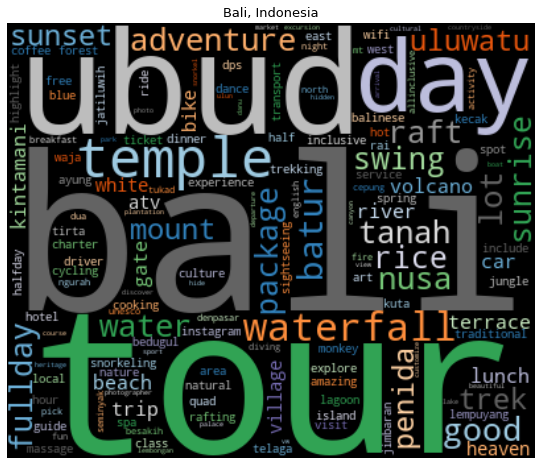

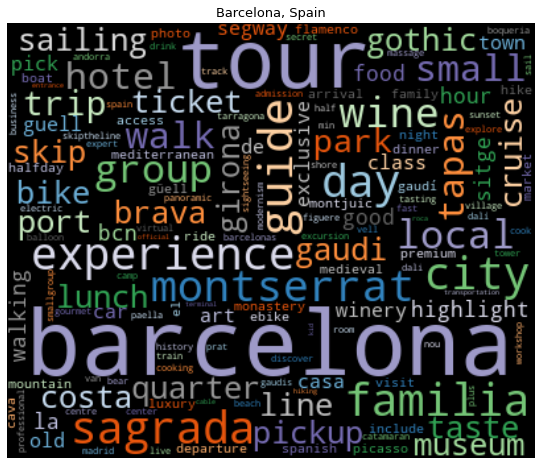

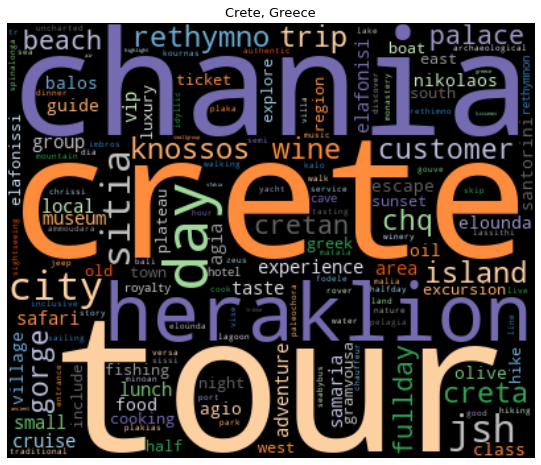

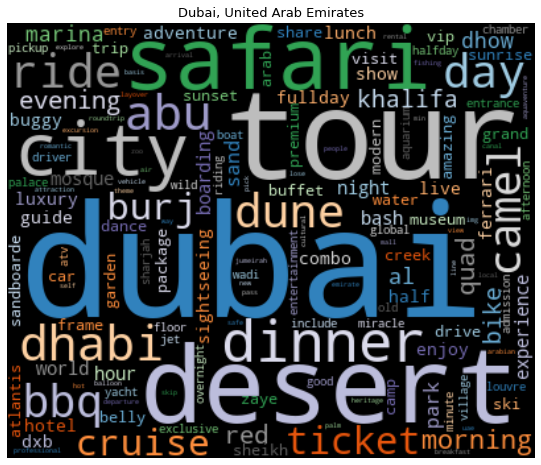

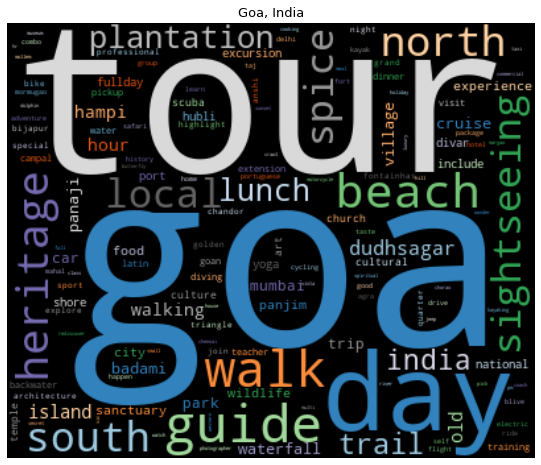

...

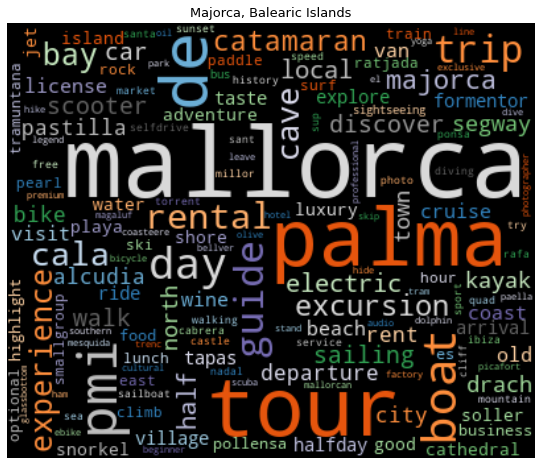

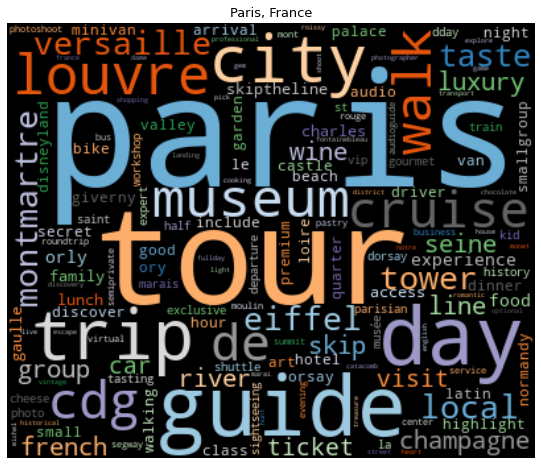

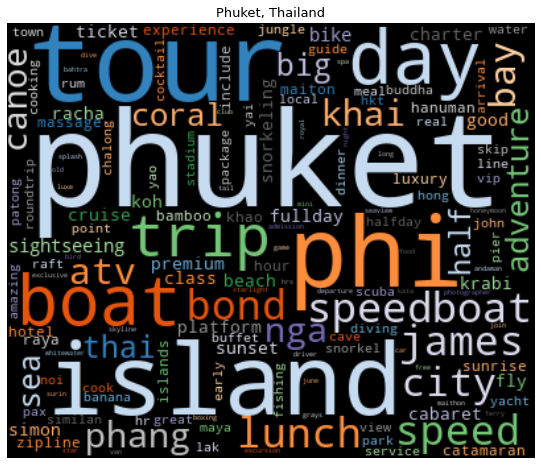

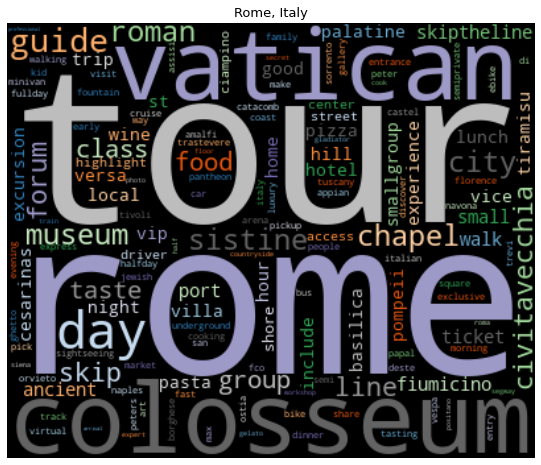

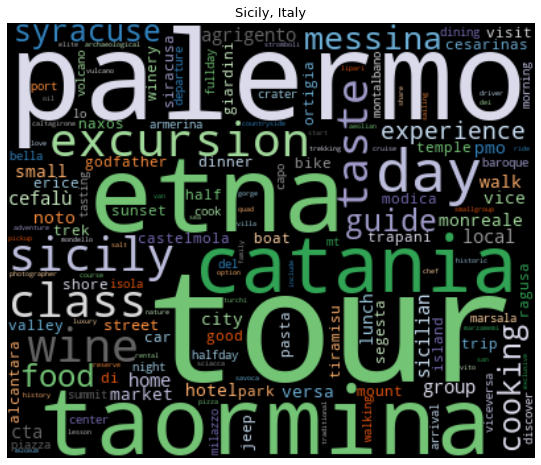

In [63]:
preprocessed_df = preprocess_df(df2, 'lemmatized')
dtm_cv = create_doc_term_matrix(preprocessed_df, 'lemmatized', count_vec=True)

for index, city in enumerate(dtm_cv.columns):
    generate_wordcloud(dtm_cv[city].sort_values(ascending=False), city)

In [ ]:
dtm_bigram = create_doc_term_matrix(df2, 'lemmatized',
                                    count_vec=True, ngram_range=(2,2))

for index, city in enumerate(dtm_bigram.columns):
    generate_wordcloud(dtm_bigram[city].sort_values(ascending=False), city)